# Water Supply Inequalities in a Large Indian City
## Spatial Analysis


This code was used to conduct a spatial analysis based on supply pocket areas for City X. Please note that the source files containing the water supply schedules nor any identifying information related to the actual City were not allowed to be shared. Thus, two lines of this code where we abbreviated city locations was removed to preserve anonymity.

In [1]:
# Import 3rd party libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl


mpl.rcParams['figure.dpi'] = 600

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')

In [2]:
#reading all the csv files
data1 = pd.read_csv('FileA.csv',header=[0], index_col=0)
data2 = pd.read_csv('FileB_part1.csv',header=[0], index_col=0)
data3 = pd.read_csv('FileB_part2.csv',header=[0], index_col=0)
data4 = pd.read_csv('FileB_part3.csv',header=[0], index_col=0)
data5 = pd.read_csv('FileC_part1.csv',header=[1], index_col=0)
data6 = pd.read_csv('FileC_part2.csv',header=[1], index_col=0)
data7 = pd.read_csv('FileC_part3.csv',header=[0], index_col=0)

#reading the Date columns in their D/M/Y formats for respective files that have date columns. Data for data 2, 5,6 could not be converted due to different dataformatting/inproper data reporting.
data1['PlanDate'] = pd.to_datetime(data1['PlanDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data1['StartDate'] = pd.to_datetime(data1['StartDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data1['StopDate'] = pd.to_datetime(data1['StopDate'],format= '%d-%m-%Y',errors='coerce').dt.date

data3['PlanDate'] = pd.to_datetime(data3['PlanDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data3['StartDate'] = pd.to_datetime(data3['StartDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data3['StopDate'] = pd.to_datetime(data3['StopDate'],format= '%d-%m-%Y',errors='coerce').dt.date

data4['PlanDate'] = pd.to_datetime(data4['PlanDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data4['StartDate'] = pd.to_datetime(data4['StartDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data4['StopDate'] = pd.to_datetime(data4['StopDate'],format= '%d-%m-%Y',errors='coerce').dt.date

data7['PlanDate'] = pd.to_datetime(data7['PlanDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data7['StartDate'] = pd.to_datetime(data7['StartDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data7['StopDate'] = pd.to_datetime(data7['StopDate'],format= '%d-%m-%Y',errors='coerce').dt.date

#dropping random rows that contained random values in specific files.
data1 = data1.dropna()

#renaming the columns for the some datasets
data5=data5.rename(columns={"Pocket Name/ID": "Pocket", "Plan Time": "PlanTime","Plan Date": "PlanDate","Supply Hrs.":"PlanSupplyHrs","StartDate":"StartDate","Start Time":"StartTime","Stop Date":"StopDate","Stop Time": "StopTime","Supply Hrs..1":"SupplyHrs","Supply Order":"SupplyOrder"})
data6=data6.rename(columns={"Pocket Name/ID": "Pocket", "Plan Time": "PlanTime","Plan Date": "PlanDate","Supply Hrs.":"PlanSupplyHrs","StartDate":"StartDate","Start Time":"StartTime","Stop Date":"StopDate","Stop Time": "StopTime","Supply Hrs..1":"SupplyHrs","Supply Order":"SupplyOrder"})

#only using specific datasets due to: (i) overlapping data (ii) only using 2023 data for spatial analysis
data = pd.concat([data1, data5, data6, data7])
data = data.reset_index(drop=True)

#removing dataset end values
data = data[data.StartDate != '2022-12-31T00:00:00.000Z']
data = data[data.StartDate != '2022-12-31']

#removing non-existent dates
data = data[data.StopDate != '29-02-2023']
data = data[data.StopDate != '31-04-2023']

#removing illogical values
data = data.replace("-", np.nan)
cols = ['Pocket', 'StartDate', 'StartTime', 'StopDate', 'StopTime']
rows_with_nan = data[data[cols].isnull().any(axis=1)]
data = data.dropna(subset=['Pocket', 'StartDate', 'StartTime', 'StopDate', 'StopTime'])

#seperating 24x7 dataset
data247 = data[data.StartDate == '24X7']

#seperating non 24x7 dataset
data = data[data.StartDate != '24X7']


#converting the dates to dateformats
data['PlanDate'] = pd.to_datetime(data['PlanDate'],infer_datetime_format=True).dt.date
data['PlanTime']=pd.to_datetime(data['PlanTime'].astype(str),infer_datetime_format=True).dt.time

data['StartDate'] = pd.to_datetime(data['StartDate'],infer_datetime_format=True).dt.date
data['StopDate'] = pd.to_datetime(data['StopDate'],infer_datetime_format=True).dt.date

data['StartTime']=pd.to_datetime(data['StartTime'].astype(str),infer_datetime_format=True).dt.time
data['StopTime']=pd.to_datetime(data['StopTime'].astype(str),infer_datetime_format=True).dt.time

import datetime as dt
data["StartTime_TS"] = data.apply(lambda row: dt.datetime.combine(row['StartDate'], row['StartTime']), axis=1)
data["StopTime_TS"] = data.apply(lambda row: dt.datetime.combine(row['StopDate'], row['StopTime']), axis=1)

#removing st or th in the supply order column
data['SupplyOrder'] = data['SupplyOrder'].str.replace('[a-zA-Z]', '')
data['SupplyOrder']  = data['SupplyOrder'].astype(int)

#calculating supply duration
data['SupplyDuration'] = data['StopTime_TS']-data['StartTime_TS']
data["SupplyDurationhr"] = data['SupplyDuration'].apply(lambda x: x.total_seconds() / 3600)

#renaming dataframe to data_2023 and last check making sure no 2022 schedules.
data_2023 = data[data['StartTime_TS'].dt.year==2023]

Split 24x7 and Normal Schedules

In [3]:
#created a specilized function to detect duplicate schedules based on our definition of a water supply schedule( if they shared the same values in the critical columns: ‘Pocket ID’, ‘Start Date’, ‘Start Time’, ‘Stop Date’, and ‘Stop Time’)
def duplicate_handling(data):
    data = data.replace(r'^\s*$', np.nan, regex=True)
    duplicates_mask = data.duplicated(subset=['Pocket','StartTime_TS', 'StopTime_TS'],keep=False)
    duplicates = data[data.duplicated(subset=['Pocket','StartTime_TS', 'StopTime_TS'],keep=False)]
    grouped = duplicates.groupby(['Pocket','StartTime_TS', 'StopTime_TS'])
    sorted_filled_df = pd.DataFrame()
    for group_name, group_data in grouped:
        sorted_group = group_data.sort_values('StopTime_TS').fillna(method='ffill')
        sorted_filled_df = pd.concat([sorted_filled_df, sorted_group], ignore_index=True)

    result_df = sorted_filled_df.drop_duplicates(subset=['Pocket','StartTime_TS', 'StopTime_TS'], keep='last')
    new_data = data[~duplicates_mask]
    data = pd.concat([new_data, result_df])
    return data
data_2023 = duplicate_handling(data_2023)

In [4]:
# Plot settings
tick_size=10

rc = {'lines.linewidth': 4,
      'axes.labelsize': 18, 
      'axes.titlesize': 18}
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 3

plt.rcParams['xtick.major.size'] = tick_size
plt.rcParams['xtick.minor.size'] = tick_size
plt.rcParams['ytick.major.size'] = tick_size
plt.rcParams['ytick.minor.size'] = tick_size
plt.rcParams['ytick.major.width'] = 2
plt.rcParams['ytick.minor.width'] = 1
plt.rcParams['xtick.minor.width'] = 2
plt.rcParams['xtick.major.width'] = 1

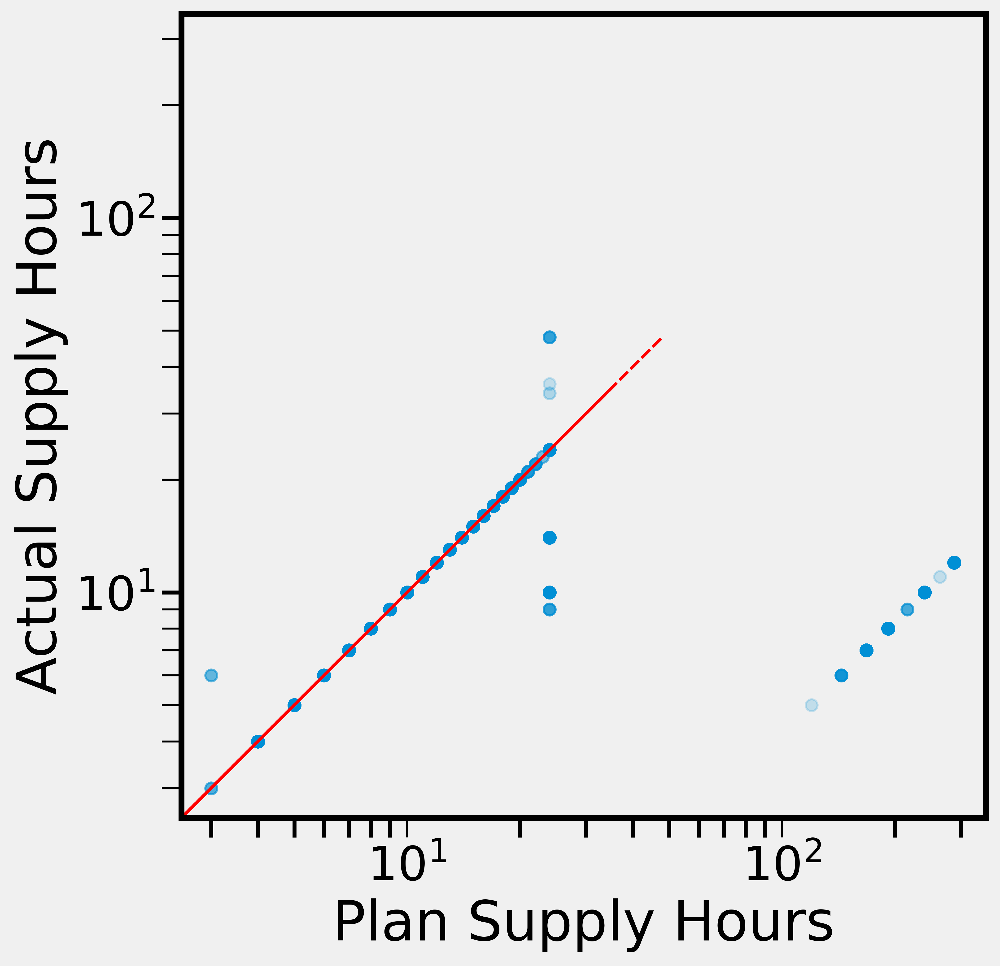

In [5]:
#inspecting High Planned Supply Hours before changes made
data_plan_ex= data_2023.copy()
data_plan_ex= data_plan_ex.dropna(subset=['PlanSupplyHrs'])

fig, ax = plt.subplots()
fig.set_figheight(7)
fig.set_figwidth(7)

ax.scatter(x=data_plan_ex['PlanSupplyHrs'], y=data_plan_ex['SupplyDurationhr'], alpha=0.1)
ax.plot(data_plan_ex['SupplyDurationhr'],data_plan_ex['SupplyDurationhr'], linestyle='--', color='red')

plt.xscale('log')
plt.yscale('log')

ax.set_xlabel('Plan Supply Hours', fontsize=28)
ax.set_ylabel('Actual Supply Hours', fontsize=28)
plt.tick_params(axis='x', which='major', labelsize=24)
plt.tick_params(axis='y', which='major', labelsize=24)
ax.grid(False)
ax.set_xlim(2.5, 350) 
ax.set_ylim(2.5, 350) 
fig.gca().set_aspect('equal', adjustable='box')


In [6]:
#To address High Planned Supply Hours, all Plan Supply Hours values greater than 48 hours were divided by 24
data_2023['PlanSupplyHrs'] = np.where(data_2023['PlanSupplyHrs'] > 48, data_2023['PlanSupplyHrs'] / 24, data_2023['PlanSupplyHrs'])
data_2023['SupplyHrs'] = np.where(data_2023['SupplyHrs'] > 48, data_2023['SupplyHrs'] / 24, data_2023['SupplyHrs'])

In [7]:
#Investigating  -ve values and recitified if an error was found using the Supply Hours column
errors_2023 = data_2023[data_2023['SupplyDurationhr'] <= 0]  
data_2023 = data_2023[~(data_2023['SupplyDurationhr'] <= 0)]  
errors_2023 = errors_2023.dropna(subset=['SupplyHrs'])

errors_2023['StopTime_TS'] =  errors_2023['StartTime_TS'] + pd.to_timedelta(errors_2023.SupplyHrs, unit='h')#adding supply hours to stop time
errors_2023 = errors_2023[errors_2023['SupplyHrs'] <= 48]

errors_2023['StopDate'] = errors_2023['StopTime_TS'].dt.date
errors_2023['StopTime'] = errors_2023['StopTime_TS'].dt.time

errors_2023['SupplyDuration'] = errors_2023['StopTime_TS']-errors_2023['StartTime_TS']
errors_2023["SupplyDurationhr"] = errors_2023['SupplyDuration'].apply(lambda x: x.total_seconds() / 3600)


In [8]:
#Merging corrected rows with the main dataframe
data_2023 = pd.concat([data_2023, errors_2023])
data_2023 = data_2023.reset_index(drop=True)


In [9]:
data_2023

,SR Name,Pocket,PlanDate,StartDate,StartTime,StopDate,StopTime,SupplyOrder,Latitude,Longitude,PlanTime,PlanSupplyHrs,SupplyHrs,StartTime_TS,StopTime_TS,SupplyDuration,SupplyDurationhr
0,Bharathi Park,BHARATHI PARK_P09,2023-01-01,2023-01-01,13:00:00,2023-01-01,22:00:00,1,11.017329,76.954971,NaT,NaN,NaN,2023-01-01 13:00:00,2023-01-01 22:00:00,0 days 09:00:00,9.0
1,Bharathi Park,BHARATHI PARK_P02,2023-01-02,2023-01-02,20:00:00,2023-01-03,04:00:00,1,11.028723,76.949480,NaT,NaN,NaN,2023-01-02 20:00:00,2023-01-03 04:00:00,0 days 08:00:00,8.0
2,Bharathi Park,BHARATHI PARK_P01,2023-01-03,2023-01-03,18:00:00,2023-01-04,06:00:00,1,11.031629,76.951497,NaT,NaN,NaN,2023-01-03 18:00:00,2023-01-04 06:00:00,0 days 12:00:00,12.0
3,Bharathi Park,BHARATHI PARK_P03,2023-01-03,2023-01-03,04:00:00,2023-01-03,08:00:00,1,11.028938,76.945663,NaT,NaN,NaN,2023-01-03 04:00:00,2023-01-03 08:00:00,0 days 04:00:00,4.0
4,Bharathi Park,BHARATHI PARK_P04,2023-01-03,2023-01-03,08:00:00,2023-01-03,12:00:00,1,11.029509,76.946906,NaT,NaN,NaN,2023-01-03 08:00:00,2023-01-03 12:00:00,0 days 04:00:00,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7965,SOWRIPALAYAM,SOWRIPALAYAM_P12,2023-05-11,2023-05-11,05:00:00,2023-05-12,05:00:00,2,NaN,NaN,05:00:00,24.0,24.0,2023-05-11 05:00:00,2023-05-12 05:00:00,1 days 00:00:00,24.0
7966,SOWRIPALAYAM,SOWRIPALAYAM_P12,2023-05-21,2023-05-21,05:00:00,2023-05-22,05:00:00,3,NaN,NaN,05:00:00,24.0,24.0,2023-05-21 05:00:00,2023-05-22 05:00:00,1 days 00:00:00,24.0
7967,SOWRIPALAYAM,SOWRIPALAYAM_P12,2023-06-07,2023-06-07,05:00:00,2023-06-08,05:00:00,1,NaN,NaN,05:00:00,24.0,24.0,2023-06-07 05:00:00,2023-06-08 05:00:00,1 days 00:00:00,24.0
7968,SOWRIPALAYAM,SOWRIPALAYAM_P12,2023-06-18,2023-06-18,22:00:00,2023-06-19,22:00:00,2,NaN,NaN,22:00:00,24.0,24.0,2023-06-18 22:00:00,2023-06-19 22:00:00,1 days 00:00:00,24.0


(2.6116516898883724, 350)

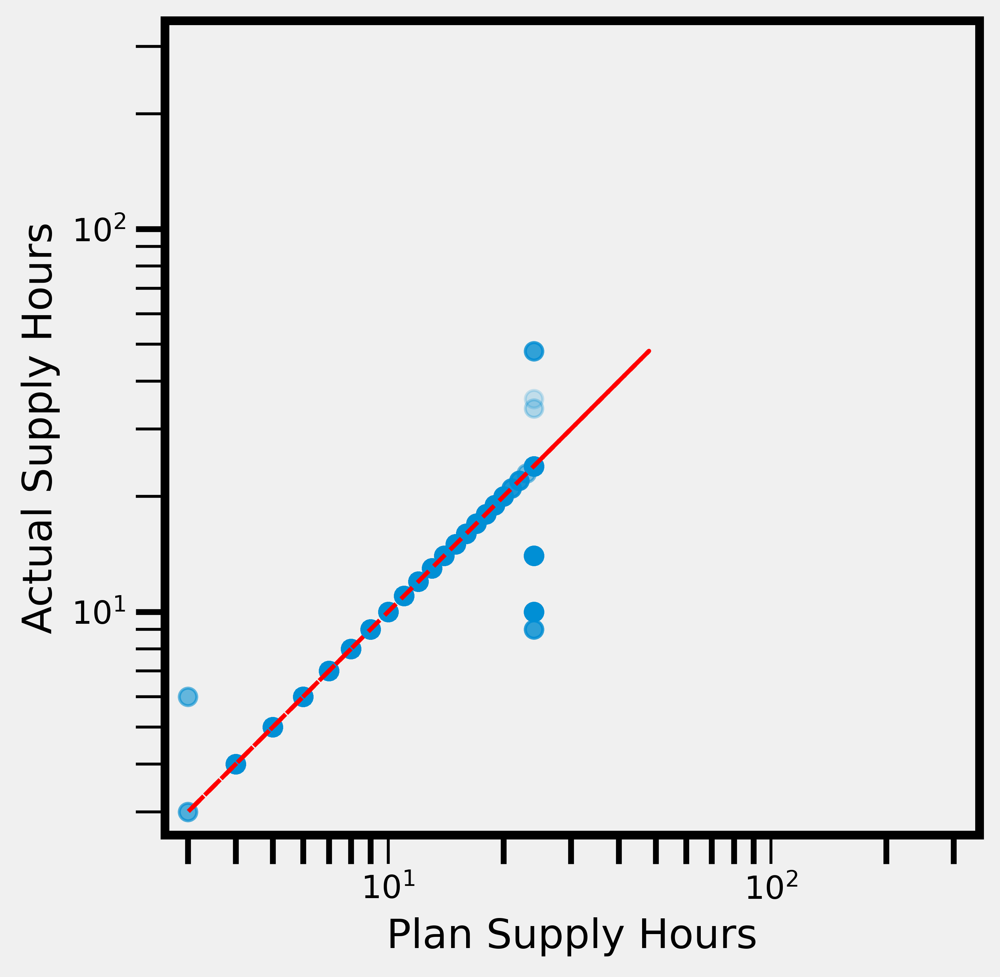

In [10]:
data_2023copy = data_2023.copy()
data_2023copy = data_2023copy[data_2023copy['PlanSupplyHrs'].notna()]
#inspecting Planned Supply Hours and Actual Supply Hours after intial changes made
fig, ax = plt.subplots()

#plotting
ax.scatter(x=data_2023copy['PlanSupplyHrs'], y=data_2023copy['SupplyDurationhr'], alpha=0.1)
ax.plot(data_2023copy['SupplyDurationhr'],data_2023copy['SupplyDurationhr'], linestyle='--', color='red')

plt.xscale('log')
plt.yscale('log')

ax.set_xlabel('Plan Supply Hours', fontsize=14)
ax.set_ylabel('Actual Supply Hours', fontsize=14)
ax.grid(False)
fig.gca().set_aspect('equal', adjustable='box')
ax.set_xlim(0, 350)
ax.set_ylim(0, 350)

In [11]:
#Calculating Reporting Period
df_sorted = data_2023.sort_values(by=['Pocket', 'StartTime_TS'])
result1 = df_sorted.groupby('Pocket').agg({'StartTime_TS': 'first'}).reset_index()
result2 = df_sorted.groupby('Pocket').agg({'StartTime_TS': 'last'}).reset_index()
result = pd.merge(result1, result2, on='Pocket')

result['StartTime_TS_x'] = result['StartTime_TS_x'].apply(lambda x: x.replace(hour=0, minute=0, second=0, microsecond=0))
result['StartTime_TS_y'] = result['StartTime_TS_y'].apply(lambda x: x.replace(hour=0, minute=0, second=0, microsecond=0))
result['SupplyDuration'] = (result['StartTime_TS_y']-result['StartTime_TS_x']).dt.days
result["SupplyDurationday"] = (result['SupplyDuration']+1)

#Calculating Number of Schedules
count_df = data_2023.groupby('Pocket')['StartTime_TS'].nunique().reset_index()
count_df.rename(columns={'StartTime_TS': 'Freq'}, inplace=True)

#Merging all the computed dataframes
merged_df = pd.merge(result, count_df, on='Pocket')


In [12]:
#Finding Missing Data spread

plt.rcParams['axes.edgecolor'] = 'k'
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.grid'] = 'False'
plt.rcParams['xtick.major.size'] = 5
plt.rcParams['xtick.minor.size'] = 2.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['xtick.minor.width'] = 0.5
plt.rcParams['xtick.minor.visible'] = 'False'
plt.rcParams['ytick.major.size'] = 5
plt.rcParams['ytick.minor.size'] = 2.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['ytick.minor.width'] = 0.5
plt.rcParams['ytick.minor.visible'] = 'False'

# Start and end dates
start_date = '2023-01-01'
end_date = '2023-06-30'

date_range = pd.date_range(start=start_date, end=end_date, freq='D')
df = pd.DataFrame({'Date': date_range})
date_range = pd.date_range(start='2023-01-01', end='2023-06-30', freq='D')
df_dates = pd.DataFrame({'Date': date_range})
df_dates['NumEntries'] = 0

#Function to count the number of rows/schedules between Timeperiods
def funcrows_dates(df_dates, result):
    df_dates['Date'] = pd.to_datetime(df_dates['Date'])
    result['StartTime_TS_x'] = pd.to_datetime(result['StartTime_TS_x'])
    result['StartTime_TS_y'] = pd.to_datetime(result['StartTime_TS_y'])

    for index, row in df_dates.iterrows():
        count = ((result['StartTime_TS_x'] <= row['Date']) & (result['StartTime_TS_y'] >= row['Date'])).sum()
        df_dates.at[index, 'NumEntries'] = count

    return df_dates

result_df = funcrows_dates(df_dates, result)
result_df['NumEntries_perc'] = (result_df['NumEntries']/(data_2023['Pocket'].nunique()))*100
result_df['NumEntries_perc_miss'] = 100-result_df['NumEntries_perc']

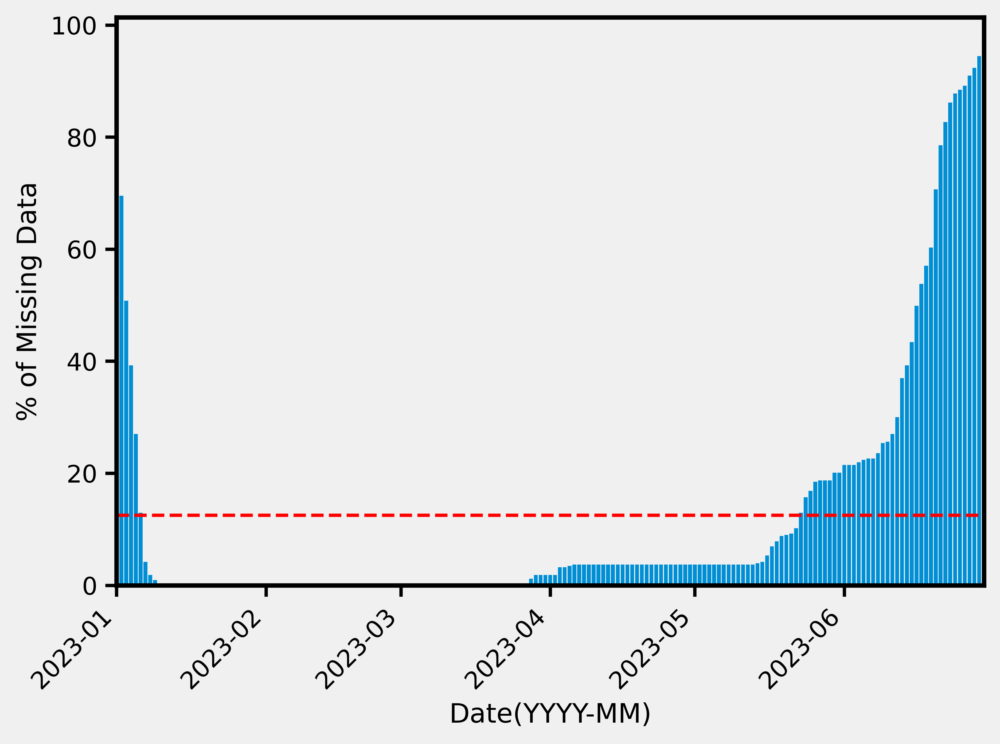

In [13]:
#Figure showing missing data
plt.bar(result_df['Date'], result_df['NumEntries_perc_miss'])
plt.axhline(y=np.mean(result_df['NumEntries_perc_miss']), color='r', linestyle='--', label='Average X')

plt.xlabel('Date(YYYY-MM)')
plt.ylabel('% of Missing Data')
plt.xticks(rotation=45, ha='right')  
plt.xlim(result_df['Date'].iloc[0], result_df['Date'].iloc[-1])
plt.grid(False)
plt.tight_layout()
plt.savefig('reportingperiods.png', dpi=300, bbox_inches='tight', transparent=True)

In [14]:
#Calculating Supply Continuity 
grouped_data = data_2023.groupby('Pocket')['SupplyDurationhr'].agg(sum).reset_index()
grouped_data.rename(columns={'SupplyDurationhr': 'TotalSupplyDur'}, inplace=True)

merged_df = pd.merge(merged_df, grouped_data, on='Pocket')  
merged_df['AvgCont'] = merged_df['TotalSupplyDur']/merged_df['SupplyDurationday']

#Extracting SR Names
merged_df['SR Name'] = merged_df['Pocket'].str.extract(r'(.+)_')

#Calculating Average Frequency and Duration
merged_df['AvgFreq'] = merged_df['Freq']/merged_df['SupplyDurationday']
merged_df['AvgFreq'] = merged_df['AvgFreq']*30
merged_df['AvgDur'] = merged_df['AvgCont']/(merged_df['AvgFreq']/30)


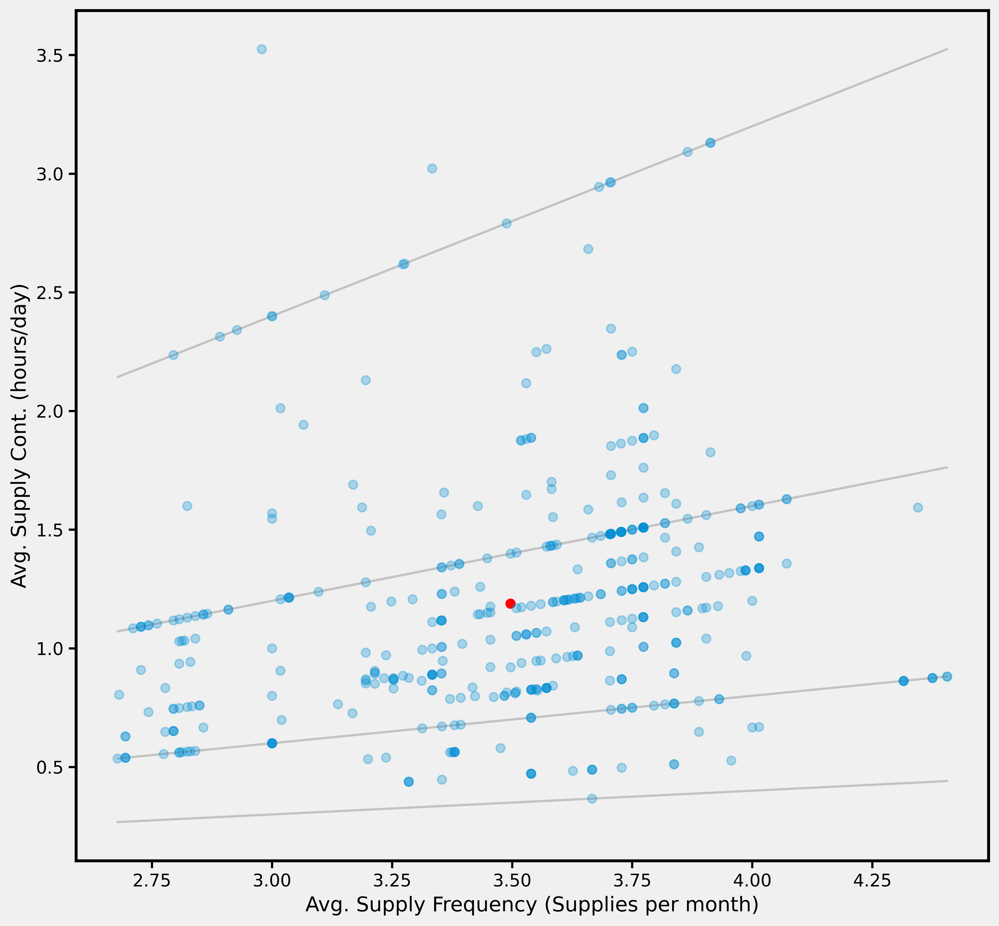

In [15]:
#Figure showing Avg Supply Cont vs Supply Frequency for each supply pocket area

fig, ax = plt.subplots()

fig.set_figheight(10)
fig.set_figwidth(10)

x=merged_df['AvgFreq']
y=merged_df['AvgCont']


y_line1 = 0.1 * x
plt.plot(x, y_line1, label='y = 0.1x', color = 'grey',alpha=0.4, zorder =1)

y_line2 = 0.2 * x
plt.plot(x, y_line2, label='y = 0.2x', color = 'grey',alpha=0.4, zorder =1)

y_line3 = 0.4 * x
plt.plot(x, y_line3, label='y = 0.4x', color = 'grey',alpha=0.4, zorder =1)

y_line4 = 0.8 * x
plt.plot(x, y_line4, label='y = 0.8x', color = 'grey',alpha=0.4, zorder =1)

#plotting
graph = ax.scatter(x=merged_df['AvgFreq'], y=merged_df['AvgCont'], alpha=0.3, zorder =2)
red_point_x = merged_df['AvgFreq'].mean()
red_point_y = merged_df['AvgCont'].mean()
plt.scatter(red_point_x, red_point_y, color='red', label='Red Point')

ax.grid(False)

ax.tick_params(axis='both', which='both', labelsize=12)

ax.set_xlabel('Avg. Supply Frequency (Supplies per month)',  fontsize=14)
ax.set_ylabel('Avg. Supply Cont. (hours/day)',  fontsize=14)

plt.savefig('scatterpockets.png', dpi=300, bbox_inches='tight', transparent=True)


In [16]:
#Saving merged_df to csv format for plotting in temporal analysis and comparing City X's IWS with Bengaluru and Delhi's IWS systems
merged_df.to_csv('avgpocket.csv')

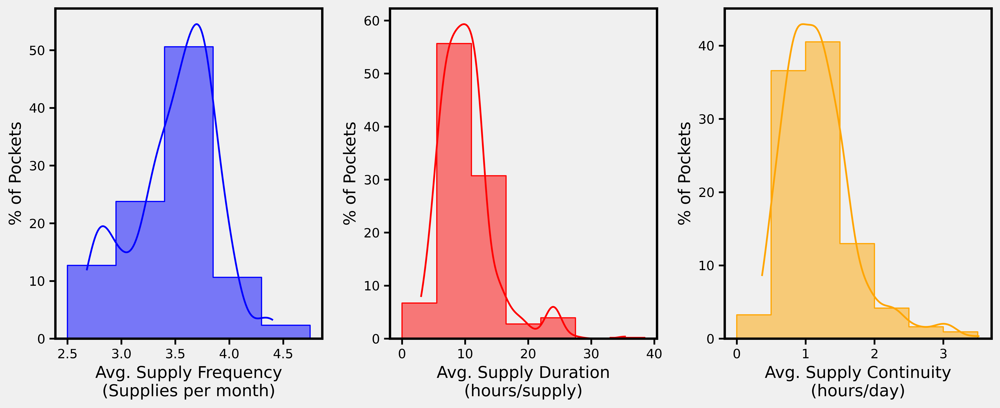

In [17]:
#Figure showing Supply Duration, Supply Frequency and Supply Continuity Distribution

x_data = merged_df['AvgFreq']
y_data = merged_df['AvgCont']
z_data = merged_df['AvgDur']

fig, axes = plt.subplots(1, 3, figsize=(12, 5))

#plotting
hist_x = sns.histplot(x_data,  kde=True, color='blue', label='X-axis', element='step', stat='percent', ax=axes[0], legend=False, binwidth=0.45, binrange=(2.5,4.5))
hist_z = sns.histplot(z_data,  kde=True, color='red', label='z-axis', element='step', stat='percent', ax=axes[1], legend=False, binwidth=5.5, binrange=(0,35))
hist_y = sns.histplot(y_data,  kde=True, color='orange', label='Y-axis', element='step', stat='percent', ax=axes[2], legend=False, binwidth=0.5, binrange=(0,3.5))

axes[0].set_xlabel('Avg. Supply Frequency\n(Supplies per month)', fontsize=14)
axes[0].set_ylabel('% of Pockets', fontsize=14)
axes[1].set_xlabel('Avg. Supply Duration\n(hours/supply)', fontsize=14)
axes[1].set_ylabel('% of Pockets', fontsize=14)
axes[2].set_xlabel('Avg. Supply Continuity\n(hours/day)', fontsize=14)
axes[2].set_ylabel('% of Pockets', fontsize=14)

axes[0].grid(False)
axes[1].grid(False)
axes[2].grid(False)

plt.tight_layout()

plt.savefig('distribute.png', dpi=300, bbox_inches='tight', transparent=True)

In [18]:
#Finding Avg supply pocket area values for each SR
merged_df_mean = merged_df.groupby(['SR Name']).agg("mean")
merged_df_mean = merged_df_mean.reset_index()

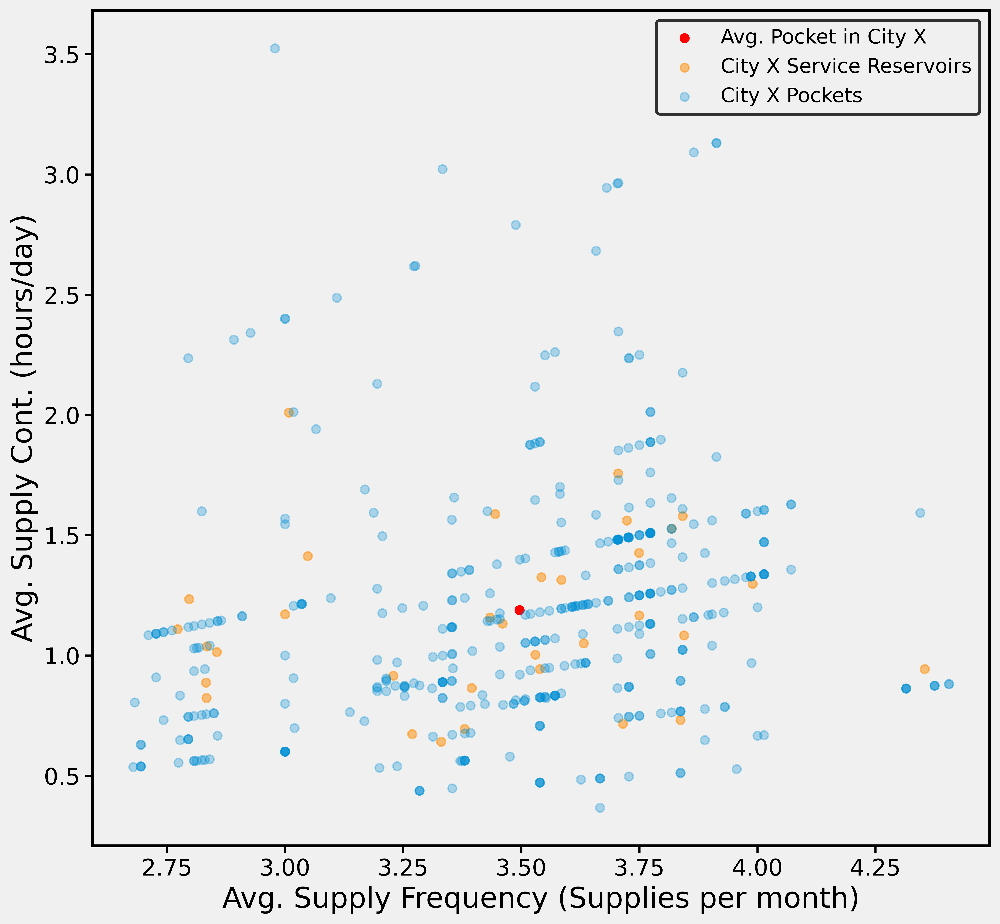

In [19]:
#Figure showing the spread of Supply Continuity, Supply Frequency and Supply Duration for supply pocket area, supply reservoir and the city average.
fig, ax = plt.subplots()

fig.set_figheight(10)
fig.set_figwidth(10)

x=merged_df['AvgFreq']
y=merged_df['AvgCont']

red_point_x = merged_df['AvgFreq'].mean()
red_point_y = merged_df['AvgCont'].mean()

#plotting
plt.scatter(red_point_x, red_point_y, color='red', label='Avg. Pocket in City X')
graph = ax.scatter(x=merged_df_mean['AvgFreq'], y=merged_df_mean['AvgCont'],color='darkorange',zorder =2, alpha=0.5,label='City X Service Reservoirs')
graph = ax.scatter(x=merged_df['AvgFreq'], y=merged_df['AvgCont'], zorder =2,alpha=0.3,label='City X Pockets')

ax.grid(False)
ax.tick_params(axis='both', which='both', labelsize=16)
ax.minorticks_off()
legend = plt.legend(edgecolor='black', fontsize='14')
legend.get_frame().set_linewidth(2)
ax.set_xlabel('Avg. Supply Frequency (Supplies per month)',  fontsize=20)
ax.set_ylabel('Avg. Supply Cont. (hours/day)',  fontsize=20)
fig.savefig('demo.png', transparent=True)
fig.show()

In [20]:
df_SR_min = merged_df.groupby(['SR Name']).agg("min")
df_SR_max = merged_df.groupby(['SR Name']).agg("max")

agg_functions = {
    'AvgCont': ['mean', 'min', 'max'],
    'AvgFreq': ['mean', 'min', 'max'],
    'AvgDur': ['mean', 'min', 'max']
}

merged_df_agg = merged_df.groupby('SR Name').agg(agg_functions).reset_index()

# Flattening the multicolumn index
merged_df_agg.columns = ['_'.join(col).strip() for col in merged_df_agg.columns.values]
merged_df_agg = merged_df_agg.rename(columns={
    'Value_mean': 'Mean',
    'Value_min': 'Min',
    'Value_max': 'Max'
})

merged_df_agg['AvgFreq_max-min'] = merged_df_agg['AvgFreq_max']-merged_df_agg['AvgFreq_min']
merged_df_agg['AvgCont_max-min'] = merged_df_agg['AvgCont_max']-merged_df_agg['AvgCont_min']
merged_df_agg['AvgDur_max-min'] = merged_df_agg['AvgDur_max']-merged_df_agg['AvgDur_min']

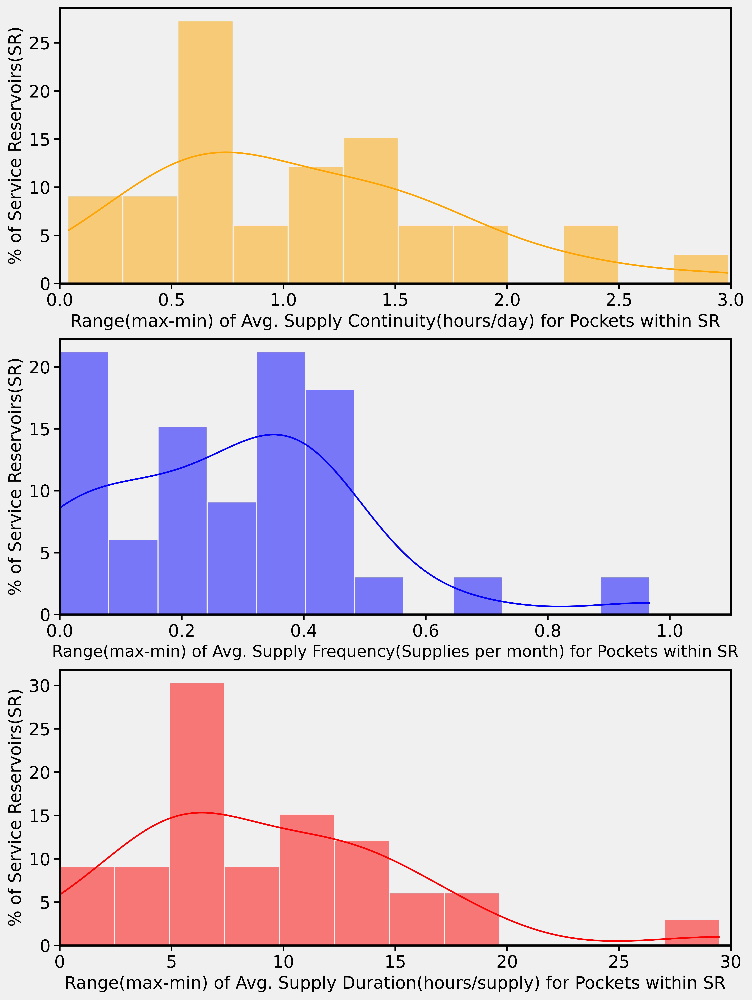

In [21]:
#  Figure showing the Range of Supply Duration, Supply Frequency and Supply Continuity for Pockets within SR
x_data = merged_df_agg['AvgCont_max-min']
y_data = merged_df_agg['AvgFreq_max-min']
z_data = merged_df_agg['AvgDur_max-min']

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

#plotting
sns.histplot(x_data, kde=True, stat='percent', color='orange', alpha=0.5, ax=axes[0], label='Avg. Supply Continuity',bins=12)
sns.histplot(y_data, kde=True, stat='percent', color='blue', alpha=0.5, ax=axes[1], label='Avg. Supply Frequency',bins=12)
sns.histplot(z_data, kde=True, stat='percent', color='red', alpha=0.5, ax=axes[2], label='Avg. Supply Frequency',bins=12)

axes[0].set_xlabel('Range(max-min) of Avg. Supply Continuity(hours/day) for Pockets within SR', fontsize=16)
axes[1].set_xlabel('Range(max-min) of Avg. Supply Frequency(Supplies per month) for Pockets within SR', fontsize=15)
axes[2].set_xlabel('Range(max-min) of Avg. Supply Duration(hours/supply) for Pockets within SR', fontsize=16)
axes[0].set_ylabel('% of Service Reservoirs(SR)', fontsize=16)
axes[1].set_ylabel('% of Service Reservoirs(SR)', fontsize=16)
axes[2].set_ylabel('% of Service Reservoirs(SR)', fontsize=16)

axes[0].set_title('')
axes[0].set_xlim(0, 3) 
axes[1].set_xlim(0, 1.1) 
axes[2].set_xlim(0, 30) 
axes[0].tick_params(axis='both', which='both', labelsize=16)
axes[1].tick_params(axis='both', which='both', labelsize=16)
axes[2].tick_params(axis='both', which='both', labelsize=16)
axes[0].grid(False)
axes[1].grid(False)
axes[2].grid(False)

plt.minorticks_off()
plt.savefig('sreservoir.png', dpi=300, bbox_inches='tight', transparent=True)

In [22]:
dict_abrv = {}#removed to preserve anonymity


merged_df["SR_abrv"] = merged_df["SR Name"].map(dict_abrv)


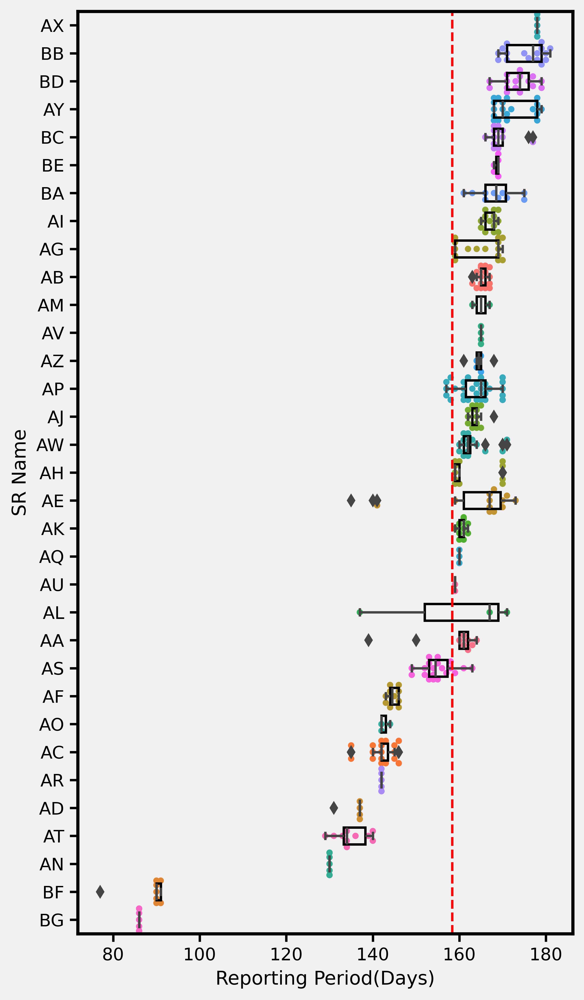

In [23]:
#Figure showing Reporting Period for each supply pocket area grouped by SR

fig,ax = plt.subplots()

fig.set_figheight(10)
fig.set_figwidth(5)

grouped_data = merged_df.groupby('SR_abrv')['SupplyDurationday'].mean().reset_index()

#plotting
q1 = sns.boxplot(data=merged_df,y='SR_abrv',x='SupplyDurationday',width=0.6, dodge=False,hue="SR_abrv",boxprops={'edgecolor': '#000000', 'fill': None},order=grouped_data.sort_values(by='SupplyDurationday', ascending=False)['SR_abrv'])
q1 = sns.swarmplot(data=merged_df,y='SR_abrv',x='SupplyDurationday', hue="SR_abrv",  size=4, zorder=0,order=grouped_data.sort_values(by='SupplyDurationday', ascending=False)['SR_abrv'])

plt.axvline(x=np.mean(merged_df['SupplyDurationday']), color='r', linestyle='--', label='Average X')

ax.grid(False)
ax.get_legend().remove()
ax.set_ylabel('SR Name')
ax.set_xlabel('Reporting Period(Days)')
plt.savefig('plot.png', dpi=300, bbox_inches='tight', transparent=True)


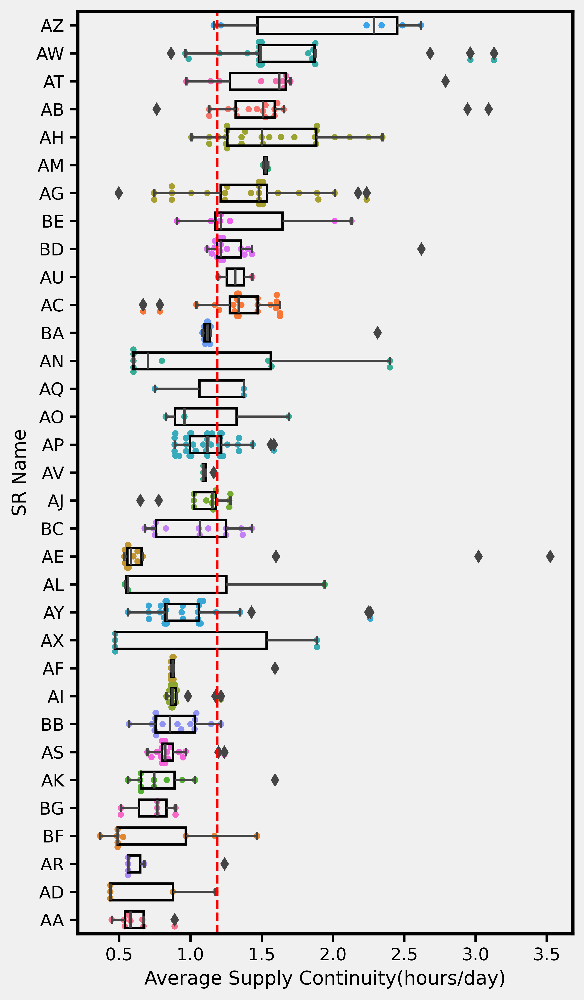

In [24]:
#Figure showing Supply Continuity data for each supply pocket area grouped by SR

fig,ax = plt.subplots()
fig.set_figheight(10)
fig.set_figwidth(5)

grouped_data = merged_df.groupby('SR_abrv')['AvgCont'].mean().reset_index()

#plotting
q1 = sns.boxplot(data=merged_df,y='SR_abrv',x='AvgCont',width=0.6, dodge=False,hue="SR_abrv",boxprops={'edgecolor': '#000000', 'fill': None},order=grouped_data.sort_values(by='AvgCont', ascending=False)['SR_abrv'])
q1 = sns.swarmplot(data=merged_df,y='SR_abrv',x='AvgCont', hue="SR_abrv",  size=4, zorder=0,order=grouped_data.sort_values(by='AvgCont', ascending=False)['SR_abrv'])

plt.axvline(x=np.mean(merged_df['AvgCont']), color='r', linestyle='--', label='Average X')
ax.grid(False)
ax.get_legend().remove()
ax.set_ylabel('SR Name')
ax.set_xlabel('Average Supply Continuity(hours/day)')
plt.savefig('scontinuity.png', dpi=300, bbox_inches='tight', transparent=True)

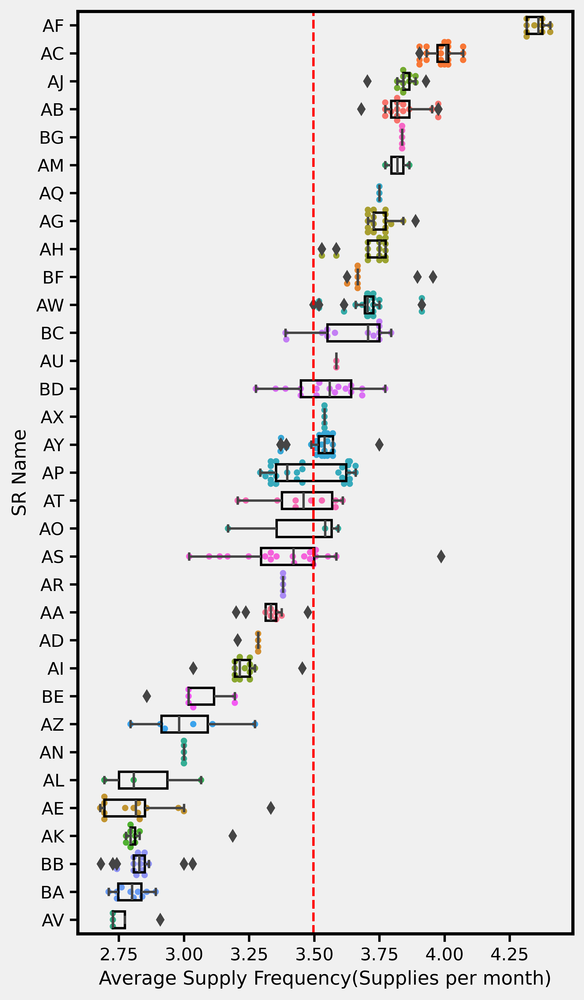

In [25]:
#Figure showing Supply Frequency for each supply pocket area grouped by SR
fig,ax = plt.subplots()
fig.set_figheight(10)
fig.set_figwidth(5)

grouped_data = merged_df.groupby('SR_abrv')['AvgFreq'].mean().reset_index()

#plotting
q1 = sns.boxplot(data=merged_df,y='SR_abrv',x='AvgFreq',width=0.6, dodge=False,hue="SR_abrv",boxprops={'edgecolor': '#000000', 'fill': None},order=grouped_data.sort_values(by='AvgFreq', ascending=False)['SR_abrv'])
q1 = sns.swarmplot(data=merged_df,y='SR_abrv',x='AvgFreq', hue="SR_abrv",  size=4, zorder=0,order=grouped_data.sort_values(by='AvgFreq', ascending=False)['SR_abrv'])

plt.axvline(x=np.mean(merged_df['AvgFreq']), color='r', linestyle='--', label='Average X')
ax.grid(False)
ax.get_legend().remove()
ax.set_ylabel('SR Name')
ax.set_xlabel('Average Supply Frequency(Supplies per month)')
plt.savefig('sfrequency.png', dpi=300, bbox_inches='tight', transparent=True)

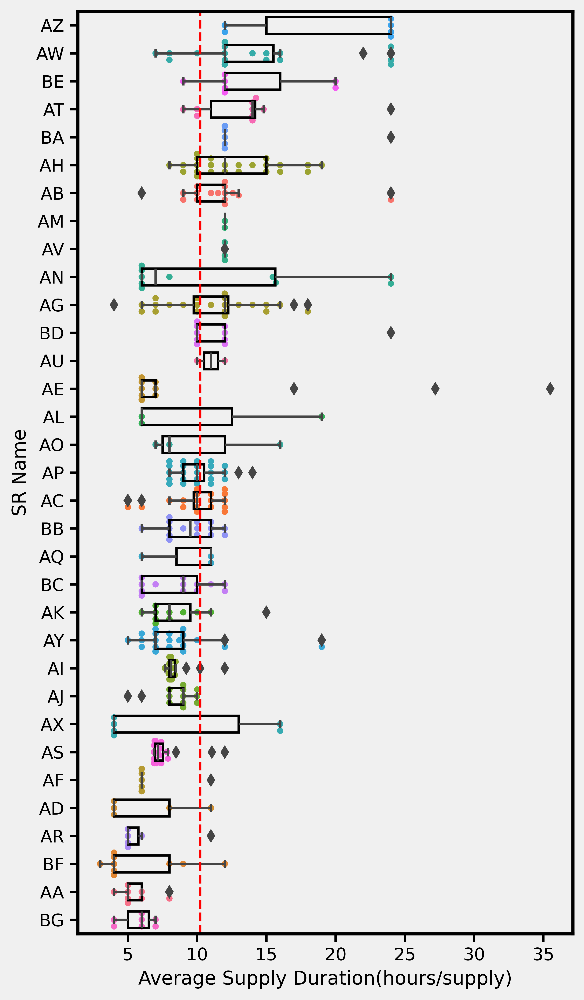

In [26]:
#Figure showing Supply Duration for each supply pocket area grouped by SR
fig,ax = plt.subplots()

fig.set_figheight(10)
fig.set_figwidth(5)
grouped_data = merged_df.groupby('SR_abrv')['AvgDur'].mean().reset_index()

#plotting
q1 = sns.boxplot(data=merged_df,y='SR_abrv',x='AvgDur',width=0.6, dodge=False,hue="SR_abrv",boxprops={'edgecolor': '#000000', 'fill': None},order=grouped_data.sort_values(by='AvgDur', ascending=False)['SR_abrv'])
q1 = sns.swarmplot(data=merged_df,y='SR_abrv',x='AvgDur', hue="SR_abrv",  size=4, zorder=0,order=grouped_data.sort_values(by='AvgDur', ascending=False)['SR_abrv'])

plt.axvline(x=np.mean(merged_df['AvgDur']), color='r', linestyle='--', label='Average X')

ax.grid(False)
ax.get_legend().remove()
ax.set_ylabel('SR Name')
ax.set_xlabel('Average Supply Duration(hours/supply)')
plt.savefig('sdurations.png', dpi=300, bbox_inches='tight', transparent=True)

In [27]:
data_plan = data_2023.copy()

data_plan['PlanTime'] =pd.to_datetime(data_2023['PlanTime'].astype(str),infer_datetime_format=True, errors='coerce').dt.time
data_plan.dropna(subset=['PlanTime'], inplace=True)

data_plan["PlanStartTime_TS"] = data_plan.apply(lambda row: dt.datetime.combine(row['PlanDate'], row['PlanTime']), axis=1)

def add_hours_to_timestamp(row):
    hours = row['PlanSupplyHrs']
    total_minutes = int(hours * 60)
    return row['PlanStartTime_TS'] + pd.Timedelta(minutes=total_minutes)

# Apply the function to the DataFrame
data_plan['PlanStopTime_TS'] = data_plan.apply(add_hours_to_timestamp, axis=1)


#calculating  planned duration
data_plan['PlanDhr'] = data_plan['PlanStopTime_TS']-data_plan['PlanStartTime_TS']
data_plan["PlanDhr"] = (data_plan['PlanDhr'].apply(lambda x: x.total_seconds() / 3600))


#calculating start diff w real and plan
data_plan['StartDiff_Plan_Real'] = data_plan['StartTime_TS']-data_plan['PlanStartTime_TS']
data_plan["StartDiff_Plan_Real"] = (data_plan['StartDiff_Plan_Real'].apply(lambda x: x.total_seconds() / 3600))

#calculating stop diff w real and plan
data_plan['StopDiff_Plan_Real'] = data_plan['StopTime_TS']-data_plan['PlanStopTime_TS']
data_plan["StopDiff_Plan_Real"] = (data_plan['StopDiff_Plan_Real'].apply(lambda x: x.total_seconds() / 3600))

#calculating duration diff w real and plan
data_plan['Dur_Plan_Real'] = data_plan['SupplyDurationhr']-data_plan['PlanDhr']


In [28]:
earlysupply = data_plan[data_plan['StartDiff_Plan_Real']>0] #early delivery
latesupply = data_plan[data_plan['StartDiff_Plan_Real']<0] #late delivery
longsupply = data_plan[data_plan['PlanDhr']<data_plan['SupplyDurationhr']] #long delivery
shortsupply = data_plan[data_plan['PlanDhr']>data_plan['SupplyDurationhr']] #short delivery

early_late = pd.concat([earlysupply,latesupply])
early_late['StartDiff_Plan_Real_day'] = early_late['StartDiff_Plan_Real']/24

In [29]:
dict_abrv = {}#removed to preserve anonymity


early_late["SR_abrv"] = early_late["SR Name"].map(dict_abrv)

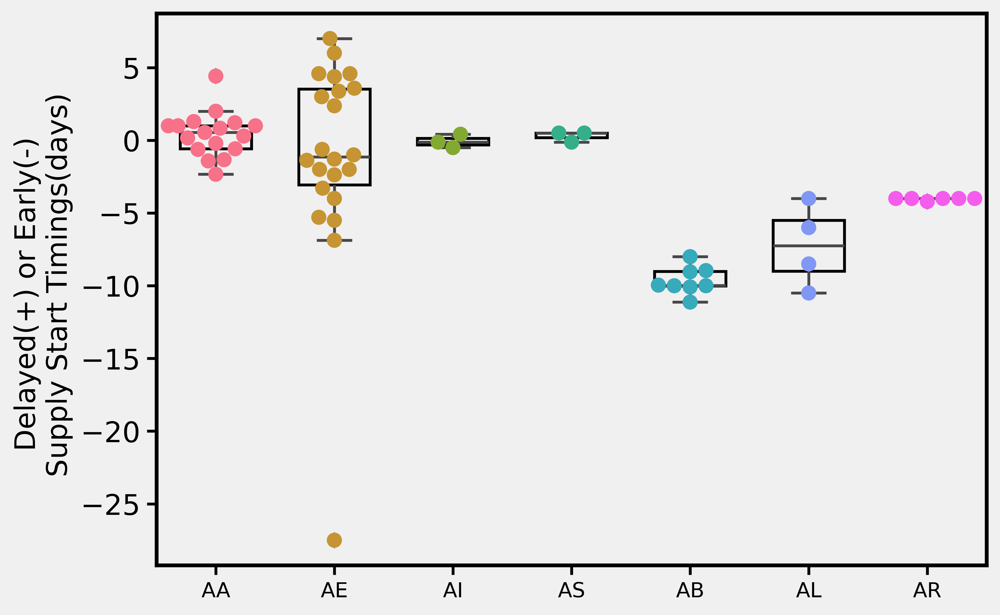

In [30]:
#Plotting Delayed and Early Start in days from Start Times
fig,ax = plt.subplots()

fig.set_figheight(5)
fig.set_figwidth(7)

#plotting
q1 = sns.swarmplot(data=early_late,x='SR_abrv',y='StartDiff_Plan_Real_day', hue="SR_abrv", size=8)
q1 = sns.boxplot(data=early_late,x='SR_abrv',y='StartDiff_Plan_Real_day',width=0.6, dodge=False,hue="SR_abrv",boxprops={'edgecolor': '#000000', 'fill': None})

ax.grid(False)
ax.get_legend().remove()
ax.set_ylabel('Delayed(+) or Early(-) \n Supply Start Timings(days)', fontsize=15)
plt.tick_params(axis='y', which='major', labelsize=15)
ax.set_xlabel('')
fig.savefig('startdelayearly.png', dpi=300, bbox_inches='tight', transparent=True)


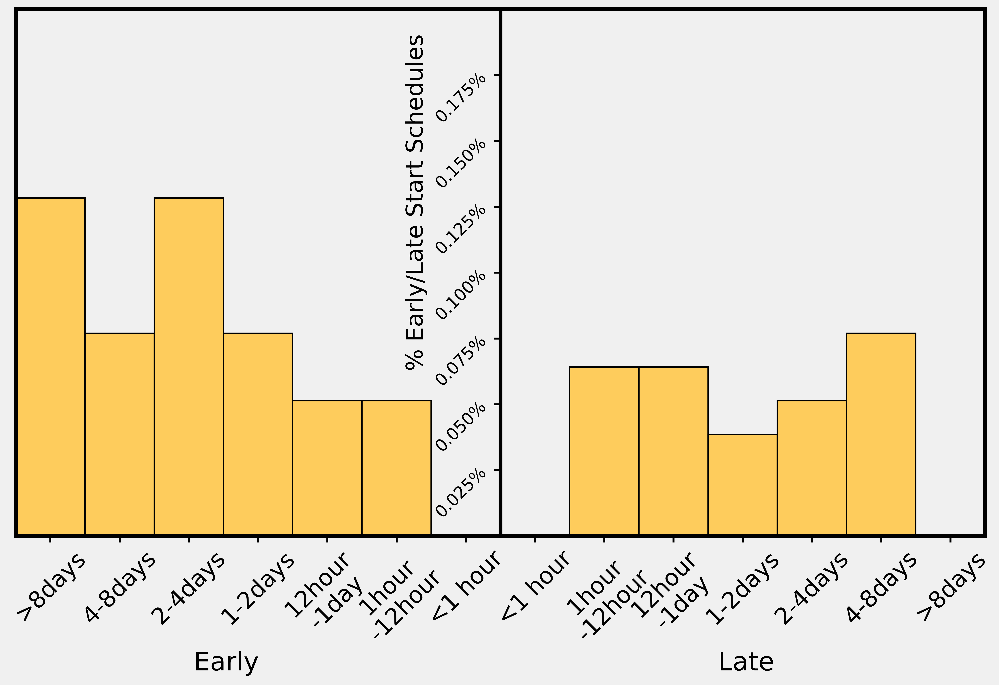

In [31]:
import matplotlib.ticker as mtick

#plotting the percentange of schedules that was supplied early/late
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 3

fig,ax = plt.subplots()
fig.set_figheight(7)
fig.set_figwidth(12)


#creating a temporary dataframe based on schedules from early_late dataframe
dataspread = [[-660,-193],[-192,-97],[-96,-49],[-48,-25],[-24,-13],[-12,-2],[-1, 0],[0, 1], [2, 12], [13, 24], [25,48], [49,96],[97,192],[193,384]] 
databond = pd.DataFrame(dataspread,columns=['Lower','Upper'])
data_plan0 = data_plan[data_plan['StartDiff_Plan_Real']!=0]
databond['counts'] = databond.apply(lambda row: data_plan0['StartDiff_Plan_Real'].between(row['Lower'], row['Upper']).sum(), axis=1)
databond['counts'] = (databond['counts']/(data_plan['StartDiff_Plan_Real'].count()))*100

#plotting
plt.bar(databond.index,databond['counts'], align='center', width=1.0, color='#fecc5c', edgecolor='black')

from copy import copy
ax.spines['left_copy'] = copy(ax.spines['left'])
ax.spines['left'].set_position(('data', 6.5))

ax.set_ylim(0,0.2)
ax.set_xlim(-0.5,13.5)
ax.set_xticklabels(['>8days','4-8days', '2-4days','1-2days','12hour\n-1day','1hour\n-12hour','<1 hour','<1 hour', '1hour\n-12hour', '12hour\n-1day','1-2days','2-4days', '4-8days','>8days'], fontsize=18,rotation=45)
ax.set_xlabel('Early                                                        Late    ', fontsize=20)
 
ax.xaxis.set_ticks(np.arange(0, 14, 1.0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(decimals=None))
ax.set_ylabel('                   % Early/Late Start Schedules', fontsize=18)
ax.set_yticklabels(['','0.025%','0.050%','0.075%','0.100%','0.125%','0.150%','0.175%','' ],rotation=45,fontsize=13)
ax.grid(False)
fig.savefig('earlylatestart%.png', dpi=300, bbox_inches='tight', transparent=True)


In [32]:
#Finding and merging supply schedules with actual supply durations lower or higher than planned supply durations
dur_planless = data_plan[data_plan['Dur_Plan_Real']<0] 
dur_planmore = data_plan[data_plan['Dur_Plan_Real']>0] 
dur_less_more = pd.concat([dur_planless,dur_planmore])

dr_count = dur_less_more['Dur_Plan_Real'].value_counts()
dr_count = dr_count.reset_index()
dr_count = dr_count.rename(columns={'index':'Dur_Plan_Real_temp'})
dr_count = dr_count.sort_values(by='Dur_Plan_Real_temp').reset_index()

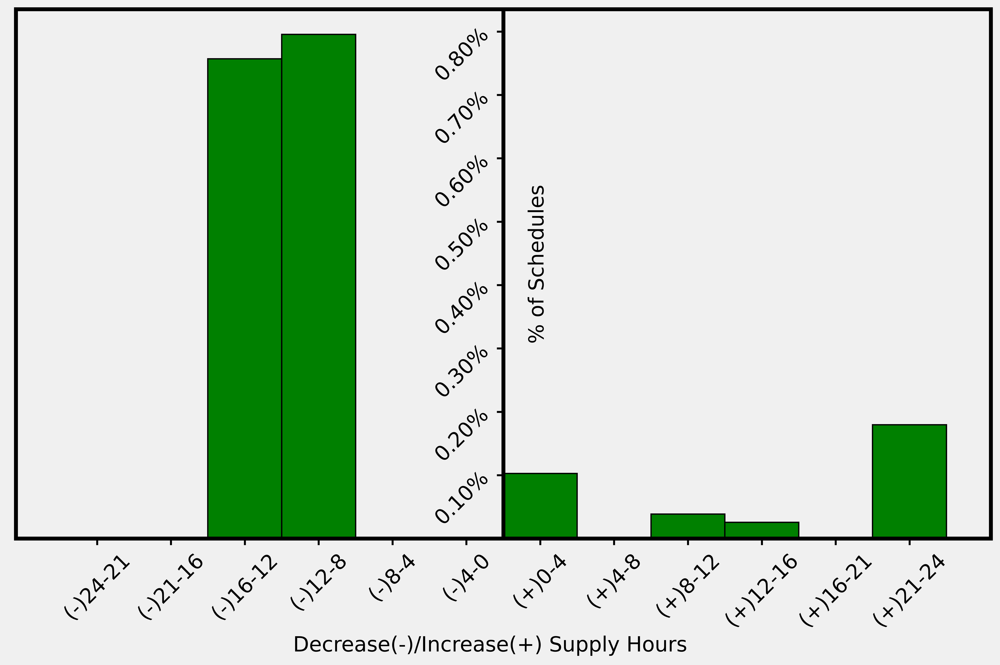

In [33]:
import matplotlib.ticker as mtick

plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 3

fig,ax = plt.subplots()

rc = {'lines.linewidth': 3, 
      'axes.labelsize': 18, 
      'axes.titlesize': 18}

fig.set_figheight(7)
fig.set_figwidth(12)

#creating a new dataframe to plot better based values from on dur_less_more dataframe
data = {
    'tempdur': [0,0,59,62,0,0,8,0,3,2,0,14],
    'no': [0,1,2,3,4,5,6,7,8,9,10,11]
}
df = pd.DataFrame(data)
df['tempfinal'] = (df['tempdur']/(data_plan['StartDiff_Plan_Real'].count()))*100

#plotting
plt.bar(df['no'],df['tempfinal'], align='center', width=1.0, color='green', edgecolor='black')

from copy import copy
ax.spines['left_copy'] = copy(ax.spines['left'])

ax.spines['left'].set_position(('data', 5.5))

ax.set_xticklabels(['(-)24-21','(-)21-16','(-)16-12','(-)12-8','(-)8-4', '(-)4-0','(+)0-4','(+)4-8','(+)8-12','(+)12-16','(+)16-21','(+)21-24' ], rotation=45,fontsize=16)

ax.set_yticklabels(['','0.10%','0.20%','0.30%','0.40%','0.50%','0.60%','0.70%','0.80%' ],rotation=45,fontsize=16)

ax.set_xlabel('Decrease(-)/Increase(+) Supply Hours    ', fontsize=16)
 
ax.xaxis.set_ticks(np.arange(0, 12, 1.0))
ax.set_ylabel('    % of Schedules ', fontsize=16,labelpad=-90)
plt.tick_params(axis='x', which='major')
plt.tick_params(axis='y', which='major')
 
ax.grid(False)
fig.savefig('decreaseincrease%.png', dpi=300, bbox_inches='tight', transparent=True)
